<a href="https://colab.research.google.com/github/t-aymen/Dog_Breed_Identification_Deep_Learning_Project/blob/main/Dog_Breed_Identification_Deep_Learning_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Dog Breed Identification**


---



This project aims to build an end-to-end multi-class image classifier to identify dog breed using TensorFlow 2.0 and TensorFlow Hub.

#### 1. **Problem Definition**

Identifying different dog breed.

#### 2. **Data**

The data is provided by kaggle as part of the Dog Breed Identification competition, and includes a training set and a test set of images of dogs. Each image has a filename that is its unique `id`. The dataset comprises 120 breeds of dogs. The goal of the competition is to create a classifier capable of determining a dog's breed from a photo.

`train.zip` - the training set, you are provided the breed for these dogs

`test.zip` - the test set, you must predict the probability of each breed for each image

`sample_submission.csv` - a sample submission file in the correct format

`labels.csv` - the breeds for the images in the train set

For more information, visit: https://www.kaggle.com/competitions/dog-breed-identification/data

#### 3. **Evaluation**

The project is evaluated on Multi Class Log Loss between the predicted probability and the observed target.

#### 4. **Features**

The dataset comprises 120 breeds of dogs in the form of **images** (unstructured data).

# **Data Exploration and Preparation**

In [ ]:
# Unzip data files
#!unzip '/content/drive/MyDrive/Dog Breed Identification/dog-breed-identification.zip' -d '/content/drive/MyDrive/Dog Breed Identification'

In [ ]:
# Import TensorFlow and TensorFlow Hub
import tensorflow as tf
import tensorflow_hub as hub

print('TF version: ', tf.__version__)
print('TF Hub version: ', hub.__version__)

TF version:  2.15.0
TF Hub version:  0.16.1


In [ ]:
# Check GPU availability
print('GPU available!' if tf.config.list_physical_devices('GPU') else 'No physical device available!')

No physical device available!


In [ ]:
# Check data labels
import pandas as pd

labels = pd.read_csv('/content/drive/MyDrive/Dog Breed Identification/labels.csv')

print(labels[:10])
print(labels.describe())

                                 id               breed
0  000bec180eb18c7604dcecc8fe0dba07         boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97               dingo
2  001cdf01b096e06d78e9e5112d419397            pekinese
3  00214f311d5d2247d5dfe4fe24b2303d            bluetick
4  0021f9ceb3235effd7fcde7f7538ed62    golden_retriever
5  002211c81b498ef88e1b40b9abf84e1d  bedlington_terrier
6  00290d3e1fdd27226ba27a8ce248ce85  bedlington_terrier
7  002a283a315af96eaea0e28e7163b21b              borzoi
8  003df8b8a8b05244b1d920bb6cf451f9             basenji
9  0042188c895a2f14ef64a918ed9c7b64  scottish_deerhound
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
# Determine how many images per breed
labels['breed'].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

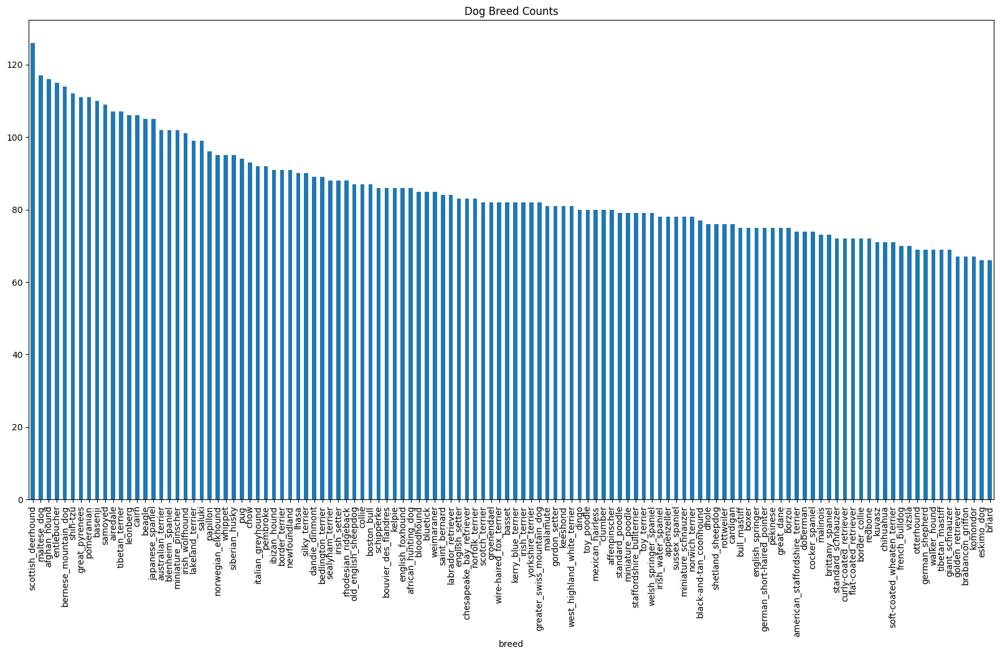

In [ ]:
# Visualize breed counts
labels['breed'].value_counts().plot(kind='bar', figsize=(20, 10)).set_title('Dog Breed Counts');

In [ ]:
labels['breed'].value_counts().describe()

count    120.000000
mean      85.183333
std       13.298122
min       66.000000
25%       75.000000
50%       82.000000
75%       91.250000
max      126.000000
Name: count, dtype: float64

ID: 000bec180eb18c7604dcecc8fe0dba07
Breed: boston_bull


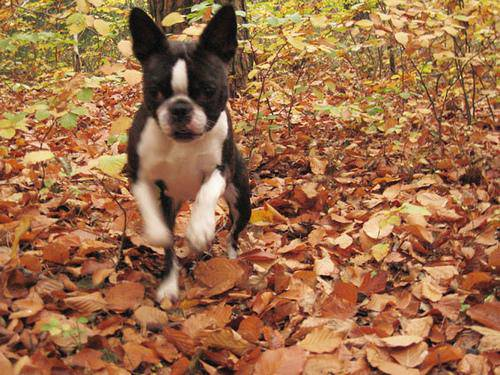

ID: 001513dfcb2ffafc82cccf4d8bbaba97
Breed: dingo


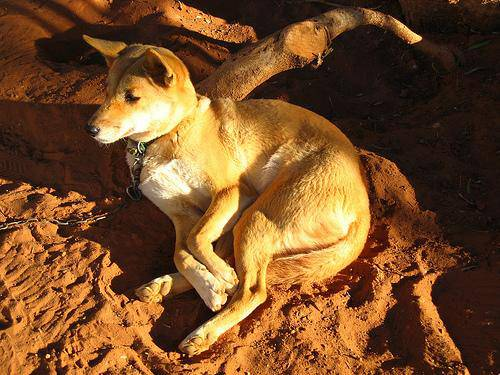

ID: 001cdf01b096e06d78e9e5112d419397
Breed: pekinese


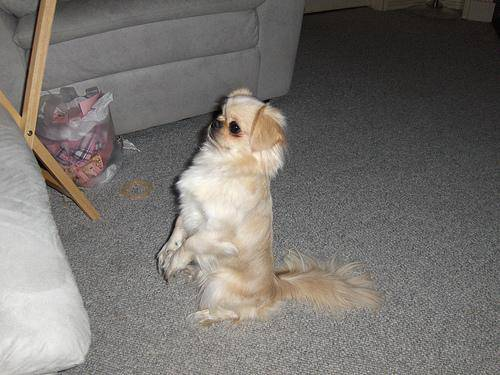

ID: 00214f311d5d2247d5dfe4fe24b2303d
Breed: bluetick


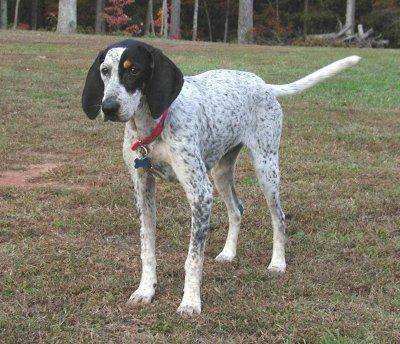

ID: 0021f9ceb3235effd7fcde7f7538ed62
Breed: golden_retriever


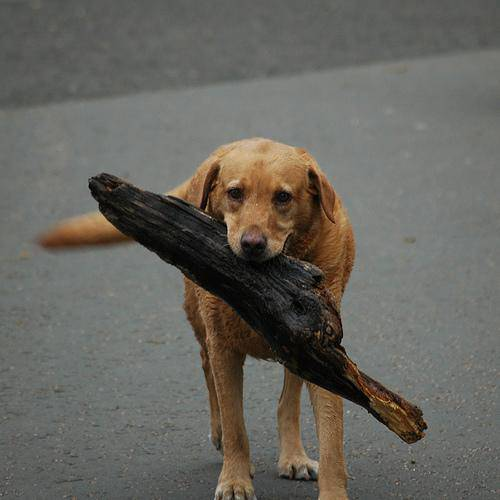

In [ ]:
# Load and view images with their labels

# Import Image library
from IPython.display import Image, display

# Create a pathname list from image IDs
filenames = ['/content/drive/MyDrive/Dog Breed Identification/train/' + fname + '.jpg' for fname in labels['id']]

# Loop through list and load images
for fname in filenames[:5]:
  id = fname.split('/')[-1].split('.')[0]
  breed = labels.loc[labels['id'] == id, 'breed'].values[0]
  print(f'ID: {id}\nBreed: {breed}')
  display(Image(fname))

In [ ]:
# Turning data labels into numbers

# Import NumPy
import numpy as np

# Turn labels into a numpy array
breed_labels = np.array(labels['breed'])

# Find unique labels
unique_labels = np.unique(breed_labels)

# Turn labels into a boolean array (one hot encoding)
bool_breed_labels = [label == unique_labels for label in breed_labels]

bool_breed_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

In [ ]:
# Creating a validation X and y set
X = filenames
y = bool_breed_labels

In [ ]:
# Experimenting with a 1000 image samples

# Set number of images
NUM_IMAGES = 1000 #@param {type: 'slider', min: 1000, max: 10000, steps: 1000}

In [ ]:
# Split data into train and validation splits
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Data preprocessing (Turning images into Tensors)

# Demo: Convert an image into a NumPy Array
from matplotlib.pyplot import imread

image = imread(filenames[42])

# Turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# Define a static image size
IMAGE_SIZE = 224

# Create a function for preprocessing images
def process_img(path, img_size=IMAGE_SIZE):
  '''
  Takes an image filepath and turn it
  into a Tensor

  1. Read image from filepath
  2. Turn image into numerical tensor with 3 color channels
  3. Normalize color values ([0-255] -> [0-1])
  4. Resize the image to a specific size

  '''
  # Step 1
  image = tf.io.read_file(path)
  # Step 2
  image = tf.image.decode_jpeg(image, channels=3)
  # Step 3
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Step 4
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

In [ ]:
# Turn data into batches (size=32)

# Create a function that returns a tuple ('image [tensor]', 'label')
def get_img_label(path, label):
  '''
  Takes an image file path and its associated label
  Process the image and returns a tuple of the image

  '''

  image = process_img(path)

  return image, label

In [ ]:
# Demo: Tuple (image, label)
(process_img(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Define batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Create batches of data out of image (X) and label (y) pairs.
  Suffle training data but not validation data.
  Accepts test data as as input (no labels).
    i.e: if it's test data, we probably don't have labels
         if it's valid data, we don't need to shuffle it
         if it's train data, we need to shuffle it
  '''
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_img).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y))) # filepaths and labels
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y))) # filepaths and labels
    data_shuffle = data.shuffle(buffer_size=len(X))
    data_batch = data_shuffle.map(get_img_label).batch(BATCH_SIZE)

  return data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check training and validation data batch attibutes
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
# Visualizing data batches

# Create a function for viewing images in data batches
def visualize_data(images, labels):
  '''
  Displays a plot of 25 images with labels from a data batch

  '''
  import matplotlib.pyplot as plt
  plt.figure(figsize=(15, 15))

  # Loop through 25 images
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1) # rows, columns, index
    # Display an image
    plt.imshow(images[i])
    # Add image label as title
    plt.title(unique_labels[labels[i].argmax()])
    # Turn axes off
    plt.axis('off')

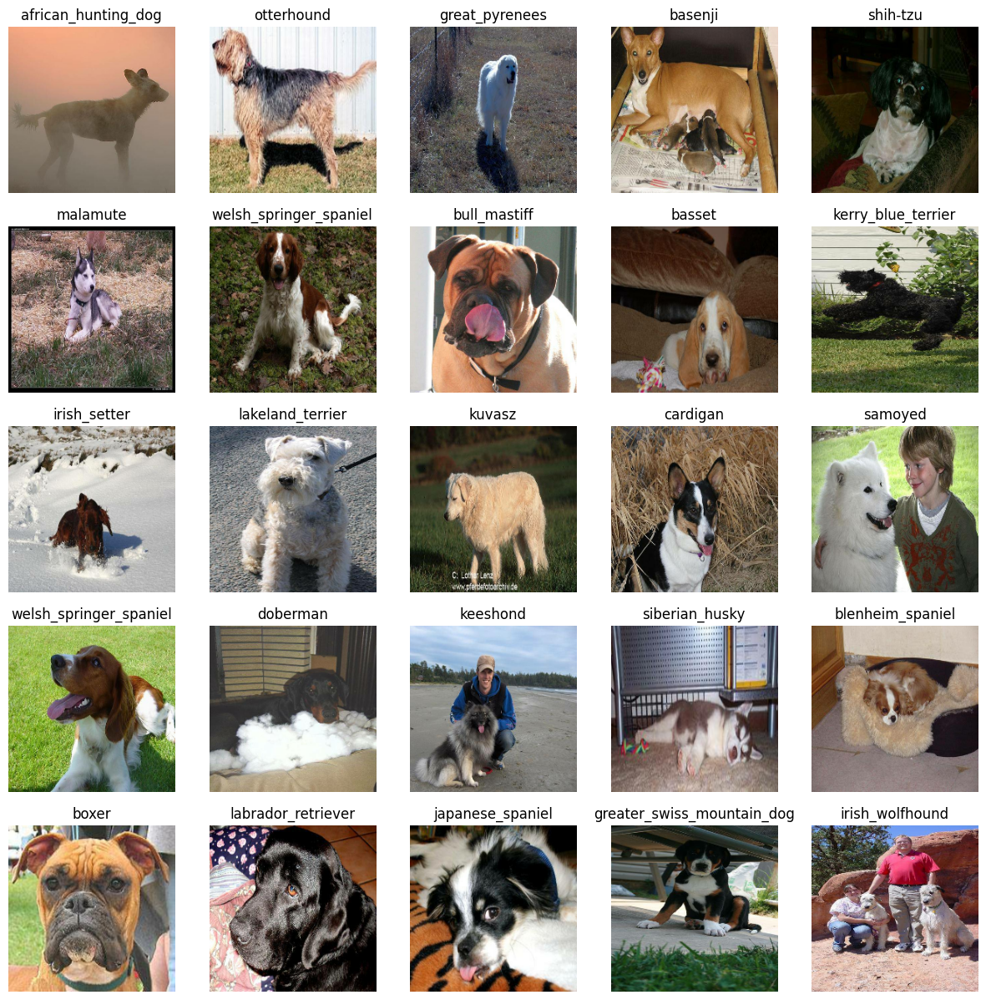

In [ ]:
# Unbatch training data
train_images, train_labels = next(train_data.as_numpy_iterator())

# Visualize training data (shuffled on run-time)
visualize_data(train_images, train_labels)

# **Modelling**

To build a deep learning model, we need to define the following:

*   Input shape (image shape in the form of Tensors)
*   Output shape (image labels in the form of Tensors)
*   URL of the model to use






In [ ]:
# Setup input shape
INPUT_SHAPE = [None, IMAGE_SIZE, IMAGE_SIZE, 3]

# Setup output shape
OUTPUT_SHAPE = len(unique_labels)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1'

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', model_url)

  # Setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url),                       # Layer 1: Input layer
      tf.keras.layers.Dense(units=output_shape,
                            activation='softmax')      # Layer 2: Output layer
      ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## **Model Callbacks**

1. Track model progress using **TensorBoard**
2. Prevent overfitting with **Early Stopping**

### TensorBoard Callback

To setup a TensorBoard callback, we'll do the following:

*   Load TensorBoard notebook extension
*   Save training logs to a directory and pass to the model's `fit()` function
*   Visualize training logs with `%tensorboard` magic function

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# Create a function to handle TensorBoard Callback

# Keep track of training date time
import datetime

# import os functionality
import os

def tensorboard_callback():
  # Create log directory for storing logs
  log_dir = os.path.join('/content/drive/MyDrive/Dog Breed Identification/logs',
                         datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))

  return tf.keras.callbacks.TensorBoard(log_dir)

### Early Stopping

Stopping model training when a certain evaluation metric cease to improve.

In [ ]:
# Create Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## **Model Training**

Training the model on `1000` images as a proof of concept.

In [ ]:
# Define number of epochs
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

To train a model, we'll do the following:

*   Create a model using `create_model()`
*   Setup a TensorBoard callback using `tensorboard_callback()`
*   Call `fit()` on the model passing it the training data, validation data and number of epochs
*   Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  '''
  Train a given model and return it
  '''
  model = create_model()

  # Create new TensorBoard session everytime we train the model
  tensorboard = tensorboard_callback()

  # Fit model to data passing it callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return trained model
  return model

In [ ]:
# Fit model to data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 155s 6s/step - loss: 4.6272 - accuracy: 0.1000 - val_loss: 3.4809 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 67s 3s/step - loss: 1.6533 - accuracy: 0.6700 - val_loss: 2.2245 - val_accuracy: 0.4550
Epoch 3/100
25/25 [==============================] - 87s 4s/step - loss: 0.5619 - accuracy: 0.9425 - val_loss: 1.7356 - val_accuracy: 0.5250
Epoch 4/100
25/25 [==============================] - 61s 2s/step - loss: 0.2533 - accuracy: 0.9937 - val_loss: 1.5689 - val_accuracy: 0.5800
Epoch 5/100
25/25 [==============================] - 60s 2s/step - loss: 0.1483 - accuracy: 0.9962 - val_loss: 1.4696 - val_accuracy: 0.6000
Epoch 6/100
25/25 [==============================] - 58s 2s/step - loss: 0.1015 - accuracy: 0.9987 - val_loss: 1.4165 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==========================

The model appears to be **overfitting** as it performs well on the training set and worse on the validation set.

### Evaluating Model with TensorBoard

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Breed\ Identification/logs

<IPython.core.display.Javascript object>

### Making Predictions

In [ ]:
# Check validation data
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions
preds = model.predict(valid_data,
                      verbose=1)

preds

7/7 [==============================] - 18s 2s/step


array([[1.4179134e-03, 9.9179160e-05, 1.4092096e-03, ..., 3.2388305e-04,
        2.6844114e-05, 5.2587077e-04],
       [1.3920238e-03, 4.6313851e-04, 2.8502468e-02, ..., 9.8596653e-04,
        2.3763550e-02, 3.2330185e-04],
       [1.6021795e-05, 3.8512368e-05, 9.1944827e-04, ..., 5.7636484e-05,
        4.6217177e-05, 1.2058018e-03],
       ...,
       [1.9516787e-05, 7.0559786e-04, 1.7940202e-04, ..., 1.7245036e-05,
        5.4212986e-05, 6.8373396e-05],
       [3.2600919e-03, 3.4014974e-04, 1.8525704e-04, ..., 1.2464220e-04,
        1.1532655e-04, 1.3249798e-02],
       [2.7566942e-04, 8.6270547e-06, 2.8261746e-04, ..., 1.0361697e-02,
        8.0831646e-04, 1.9819539e-05]], dtype=float32)

In [ ]:
# Check prediction shape
preds.shape

(200, 120)

In [ ]:
# First prediction
index = 66
print(preds[index])
print(f'\nMax prediction probability: {np.max(preds[index])}')
print(f'\nSum predictions: {np.sum(preds[index])}')
print(f'\nMax index: {np.argmax(preds[index])}')
print(f'\nPredicted label: {unique_labels[np.argmax(preds[index])]}')

[2.7819170e-04 2.3915993e-05 6.4074554e-02 2.0390095e-03 4.1250425e-04
 6.9534162e-04 5.7862112e-03 6.7886919e-01 6.3238590e-04 2.6061242e-03
 1.2925961e-03 4.0270737e-04 4.8969465e-04 3.8356159e-04 2.5808788e-04
 5.5810681e-04 6.0365826e-04 5.2942632e-05 4.1129225e-04 4.3468182e-03
 3.3014207e-04 2.9576281e-03 9.8949669e-05 6.4325730e-05 1.4719981e-04
 8.4473810e-05 5.3647119e-03 7.6771164e-03 3.8554474e-05 1.1856632e-03
 3.7978322e-04 8.2057159e-06 3.1053487e-04 1.3436368e-03 7.6962198e-05
 3.3069886e-05 1.6041195e-02 5.8321799e-03 2.6465813e-04 6.2454352e-04
 2.4504287e-04 4.3374923e-05 3.8271720e-04 4.1400646e-03 1.0469184e-04
 2.9589511e-03 3.5350723e-04 5.0826766e-05 6.4724300e-05 3.7347436e-05
 9.4539348e-05 6.2811181e-05 1.1148444e-05 9.1124028e-03 2.7747152e-04
 3.2124113e-02 1.1794694e-03 6.6034019e-04 1.0683385e-03 1.7620308e-05
 3.6714145e-03 1.9182764e-03 6.1456827e-05 1.5113139e-04 4.1741313e-04
 2.7776475e-04 7.0590613e-04 1.2128864e-04 1.3461763e-04 6.5412467e-05
 2.385

In [ ]:
# Turn prediction probabilities to their respective label
def get_pred_label(preds_proba):
  '''
  turns an array of prediction probabilities into a text label
  '''
  return unique_labels[np.argmax(preds_proba)]

In [ ]:
# Get predicted labels
pred_label = get_pred_label(preds[66])

pred_label

'basenji'

In [ ]:
# Create a function to unbatch validation data and compare predictions to true labels
def _unbatch(batch):
  images = []
  labels = []

  for image, label in batch.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])

  return images, labels

In [ ]:
valid_images, valid_labels = _unbatch(valid_data)

In [ ]:
valid_images[66], valid_labels[66], get_pred_label(preds[66])

(array([[[0.08235294, 0.07058824, 0.04313726],
         [0.08235294, 0.07058824, 0.04313726],
         [0.08235294, 0.07058824, 0.04313726],
         ...,
         [0.20241599, 0.13182774, 0.03771009],
         [0.20566353, 0.13507529, 0.04095763],
         [0.20633756, 0.13574931, 0.04163165]],
 
        [[0.07570028, 0.06393558, 0.0364846 ],
         [0.07570028, 0.06393558, 0.0364846 ],
         [0.07570028, 0.06393558, 0.0364846 ],
         ...,
         [0.2085943 , 0.13016292, 0.03604528],
         [0.21225765, 0.13382627, 0.03970862],
         [0.21474966, 0.13631828, 0.04220063]],
 
        [[0.06729692, 0.05553222, 0.02808124],
         [0.06729692, 0.05553222, 0.02808124],
         [0.06729692, 0.05553222, 0.02808124],
         ...,
         [0.20880331, 0.12974167, 0.03201758],
         [0.21209024, 0.13302861, 0.03530452],
         [0.21302523, 0.1339636 , 0.0362395 ]],
 
        ...,
 
        [[0.18078882, 0.13545386, 0.06926101],
         [0.24569656, 0.19336814, 0.11751

### Visualize Predictions and True labels

Creating a function that:

*   Takes an array of prediction probabilities, an array of true labels, an array of images and an integer
*   Convert the prediction probabilities to a predicted label
*   Plot the predicted label, its prediction probability, the true label and target image




In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def plot_preds(preds_proba, labels, images, n=1):
  '''
  visualize prediction, ground truth and image for sample n
  '''
  pred_proba, true_label, image = preds_proba[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_proba)

  # Plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Apply some conditional formatting
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'


  # Set title
  plt.title('Predicted Label: {} - Prediction Probablity: {:2.0f}% - True Label: {}'.format(pred_label,
                                                                                            np.max(pred_proba)*100,
                                                                                            true_label),
            color=color,
            fontsize=10,
            y=1.02)

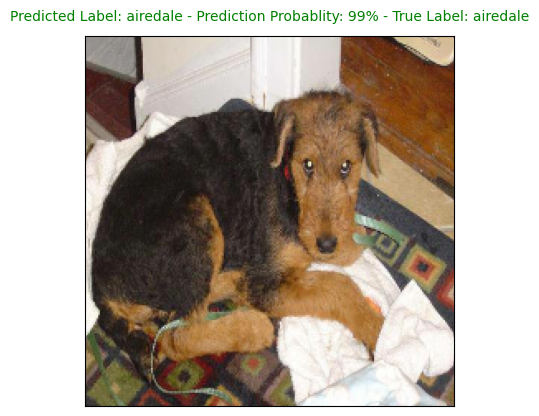

In [ ]:
plot_preds(preds, valid_labels, valid_images, n=4)

In [ ]:
# Visualize top 10 predictions for a given sample
def plot_top_pred_conf(preds_proba, labels, n=1):
  '''
  Plot top 10 highest prediction confidences alongside truth labels for sample n
  '''
  pred_proba, true_label = preds_proba[n], labels[n]

  # Get predicted labels
  pred_label = get_pred_label(pred_proba)

  # Find top 10 prediction confidence indices
  top_10_idx = pred_proba.argsort()[-10:][::-1]

  # Find top 10 prediction confidence values
  top_10_vals = pred_proba[top_10_idx]

  # Find top 10 prediction labels
  top_10_labels = unique_labels[top_10_idx]

  # Setup plot
  plot = plt.bar(np.arange(len(top_10_labels)),
                 top_10_vals,
                 color='grey')
  plt.xticks(np.arange(len(top_10_labels)),
             labels=top_10_labels,
             rotation='vertical')

  # Change color of true labels
  if np.isin(true_label, top_10_labels):
    plot[np.argmax(top_10_labels == true_label)].set_color('green')
  else:
    pass

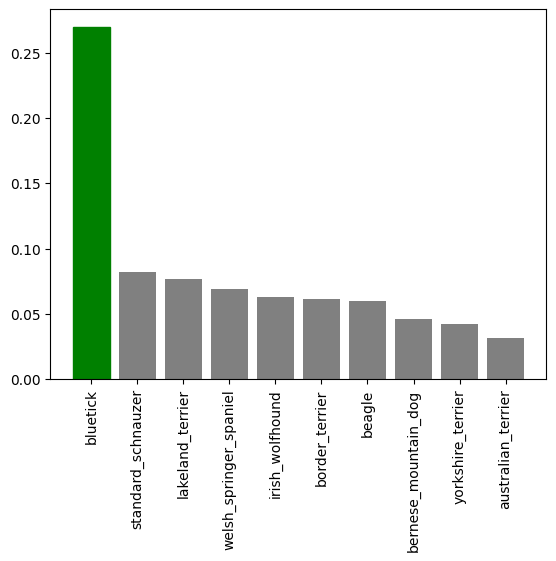

In [ ]:
plot_top_pred_conf(preds, valid_labels, n=3)

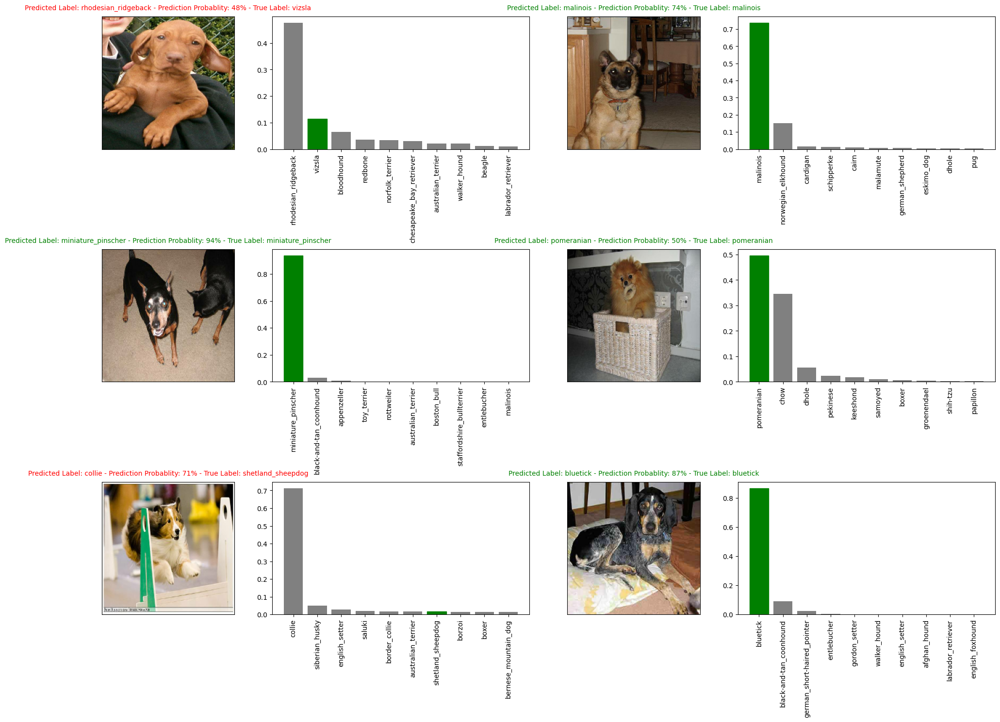

In [ ]:
# Putting it all together
i_multiplier = np.random.randint(0, len(preds))
n_rows = 3
n_cols = 2
n_imgs = n_rows * n_cols

plt.figure(figsize=(10*n_cols, 5*n_rows))

for i in range(n_imgs):
  plt.subplot(n_rows, 2*n_cols, 2*i+1)
  plot_preds(preds_proba=preds,
             labels=valid_labels,
             images=valid_images,
             n=i+i_multiplier)
  plt.subplot(n_rows, 2*n_cols, 2*i+2)
  plot_top_pred_conf(preds_proba=preds,
                     labels=valid_labels,
                     n=i+i_multiplier)
  plt.tight_layout(h_pad=1)

plt.show()

We can see that the more complex an image gets, the harder for the model to correctly classify it.

### Saving Trained Model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Save a given model in a directory and append a suffix string
  '''
  model_dir = os.path.join('/content/drive/MyDrive/Dog Breed Identification/models',
                           datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  model_path = model_dir + '-' + suffix + '.keras' # extension format
  print(f'Saving model to: {model_path}')
  model.save(model_path)

  return model_path

In [ ]:
# Create a function to load a model
def load_model(model_path):
  '''
  load a saved model from specified path
  '''
  print(f'Loading a model from {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})

  return model

In [ ]:
# Save the model
save_model(model, suffix='Trained on 1000 Samples (mobilenet_v2_Adam)')

Saving model to: /content/drive/MyDrive/Dog Breed Identification/models/20240615-125137-Trained on 1000 Samples (mobilenet_v2_Adam).keras


'/content/drive/MyDrive/Dog Breed Identification/models/20240615-125137-Trained on 1000 Samples (mobilenet_v2_Adam).keras'

In [ ]:
# Load model
trained_model = load_model('/content/drive/MyDrive/Dog Breed Identification/models/20240614-125333-Trained on 1000 Samples (mobilenet_v2_Adam).keras')

Loading a model from /content/drive/MyDrive/Dog Breed Identification/models/20240614-125333-Trained on 1000 Samples (mobilenet_v2_Adam).keras


In [ ]:
# Evaluate loded model
trained_model.evaluate(valid_data)

7/7 [==============================] - 18s 2s/step - loss: 1.2574 - accuracy: 0.6950


[1.25737726688385, 0.6949999928474426]

## **Training Model on Full Dataset**

In [ ]:
# Create full data batches
f_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
# Instantiate model
f_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1


In [ ]:
# Instantiate model callbacks
f_model_tensorboard = tensorboard_callback()
f_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                          patience=3)

In [ ]:
# Fit model to full data
f_model.fit(x=f_data,
            epochs=NUM_EPOCHS,
            callbacks=[f_model_tensorboard, f_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1447s 4s/step - loss: 1.3336 - accuracy: 0.6721
Epoch 2/100
320/320 [==============================] - 647s 2s/step - loss: 0.3991 - accuracy: 0.8816
Epoch 3/100
320/320 [==============================] - 701s 2s/step - loss: 0.2354 - accuracy: 0.9371
Epoch 4/100
320/320 [==============================] - 706s 2s/step - loss: 0.1536 - accuracy: 0.9637
Epoch 5/100
320/320 [==============================] - 673s 2s/step - loss: 0.1079 - accuracy: 0.9779
Epoch 6/100
320/320 [==============================] - 631s 2s/step - loss: 0.0775 - accuracy: 0.9872
Epoch 7/100
320/320 [==============================] - 631s 2s/step - loss: 0.0569 - accuracy: 0.9929
Epoch 8/100
320/320 [==============================] - 627s 2s/step - loss: 0.0455 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 625s 2s/step - loss: 0.0368 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 609s 2s/step - loss: 0.03

In [ ]:
# Save model
save_model(f_model, suffix='full_data_trained_model_(mobilenet_v2_Adam)')

Saving model to: /content/drive/MyDrive/Dog Breed Identification/models/20240615-164650-full_data_trained_model_(mobilenet_v2_Adam).keras


'/content/drive/MyDrive/Dog Breed Identification/models/20240615-164650-full_data_trained_model_(mobilenet_v2_Adam).keras'

## **Make Prediction on Test Data**

To make predictions on the test data, we'll do the following:

*   Get test data filenames
*   Convert filenames into data batches using `create_data_batches()` and set `test_data` parameter to `True` (i.e. no labels)
*   Call `predict()` function on the model

In [ ]:
# Get test data filenames
import os
test_path = '/content/drive/MyDrive/Dog Breed Identification/test/'
t_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
# Convert filenames into data batches
test_data = create_data_batches(X=t_filenames, test_data=True)

Creating test data batches...


In [ ]:
# Make predictions
test_preds = f_model.predict(test_data,
                             verbose=1)

324/324 [==============================] - 617s 2s/step


In [ ]:
# Export predictions to cvs file
np.savetxt('/content/drive/MyDrive/Dog Breed Identification/predictions.csv', test_preds, delimiter=',')

# **Create Kaggle Submission Sample**

In [ ]:
# Create DataFrame with ID and breed label columns
df_preds = pd.DataFrame(columns=['id'] + list(unique_labels))

In [ ]:
# Extract ID from test images filenames
ids = []

for fname in t_filenames:
  id = fname.split('.')[0]
  ids.append(id)

ids[:10]

['/content/drive/MyDrive/Dog Breed Identification/test/ed1f9841f56f9e0122782f734919f521',
 '/content/drive/MyDrive/Dog Breed Identification/test/e91094730afaa4ade3d3041d96d57f3a',
 '/content/drive/MyDrive/Dog Breed Identification/test/f13508048aa548af116601fa59bd4c62',
 '/content/drive/MyDrive/Dog Breed Identification/test/f2081ded3fa95eb118ff88b7eaad992e',
 '/content/drive/MyDrive/Dog Breed Identification/test/ea280d6cb873df2eb683f0a5f13e3dce',
 '/content/drive/MyDrive/Dog Breed Identification/test/eb44625ed1113825fe1f23e50222cca1',
 '/content/drive/MyDrive/Dog Breed Identification/test/f409b8113b2c2ab861131c4bd1c0b029',
 '/content/drive/MyDrive/Dog Breed Identification/test/e9bcd763afd5e192fc047267c0b3cacd',
 '/content/drive/MyDrive/Dog Breed Identification/test/e967dd3dc67352cc2525c8283bf2751d',
 '/content/drive/MyDrive/Dog Breed Identification/test/ec8bf9fd1bae9c6cc54b996425538a5c']

In [ ]:
# Append IDs to dataframe
df_preds['id'] = ids

df_preds[:10]

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,/content/drive/MyDrive/Dog Breed Identificatio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,/content/drive/MyDrive/Dog Breed Identificatio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,/content/drive/MyDrive/Dog Breed Identificatio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,/content/drive/MyDrive/Dog Breed Identificatio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,/content/drive/MyDrive/Dog Breed Identificatio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,/content/drive/MyDrive/Dog Breed Identificatio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,/content/drive/MyDrive/Dog Breed Identificatio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,/content/drive/MyDrive/Dog Breed Identificatio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,/content/drive/MyDrive/Dog Breed Identificatio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,/content/drive/MyDrive/Dog Breed Identificatio...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Append prediction probabilities for each breed to dataframe
df_preds[list(unique_labels)] = test_preds

In [ ]:
# Export dataframe as csv file
df_preds.to_csv('/content/drive/MyDrive/Dog Breed Identification/mobilenet_v2_test_predictions.csv',
                index=False)